# Use Recurrence Quantification Analysis for change detection in Sentinel-1 data

## Aim of this Hands on Session

- Detect Deforestation in Mexico
- Use Recurrence Quantification Analysis
- Get a feel for working with SAR data in Julia

## Area of Interest

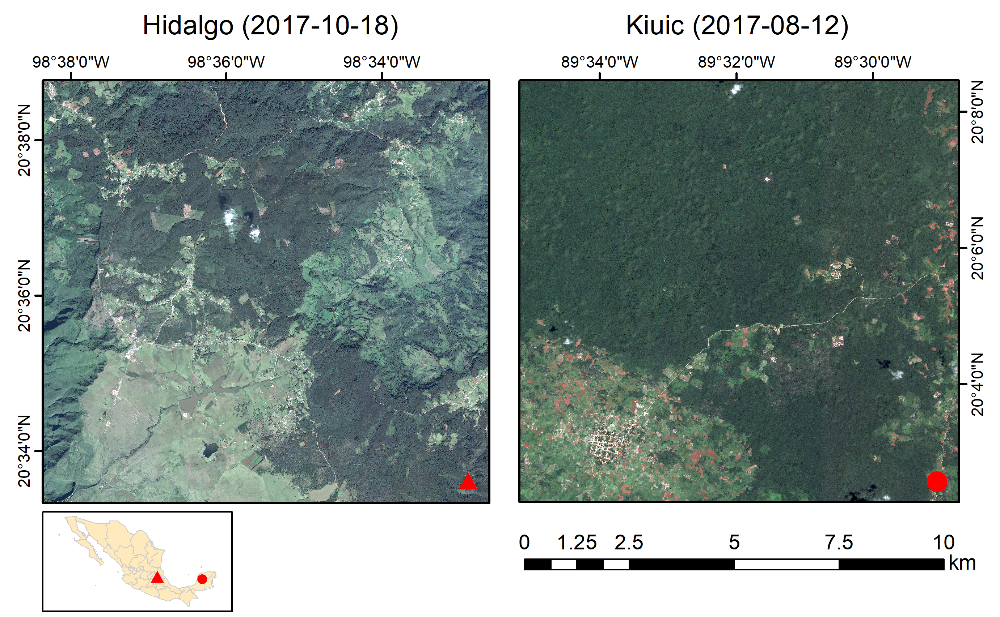

## Load Sentinel-1 Data

In [9]:
using Zarr, YAXArrays, Rasters, YAXArrayBase

In [10]:
s1cube = Cube("data/s1_hidalgo_ascending.zarr")

YAXArray with the following dimensions
lon                 Axis with 1071 Elements from -98.6870371374164 to -98.49479766661482
lat                 Axis with 1008 Elements from 20.69170568459912 to 20.510784986377452
Time                Axis with 105 Elements from 2015-11-18T00:00:00 to 2019-05-20T00:00:00
Polarisation        Axis with 2 elements: VH VV 
name: layer
Total size: 864.83 MB


## Time Series of Deforested area vs stable forest


In [3]:
using CairoMakie

In [43]:
"""
dB(x)
Convert x into the logarithmic dB scale
"""
dB(x) = 10 * log10(x)
#dB(x::AbstractArray) = dB.(x)

dB

In [11]:
s1db = map(dB, s1cube)

YAXArray with the following dimensions
lon                 Axis with 1071 Elements from -98.6870371374164 to -98.49479766661482
lat                 Axis with 1008 Elements from 20.69170568459912 to 20.510784986377452
Time                Axis with 105 Elements from 2015-11-18T00:00:00 to 2019-05-20T00:00:00
Polarisation        Axis with 2 elements: VH VV 
name: layer
Total size: 864.83 MB


In [12]:
using Shapefile, Extents
using TableOperations: TableOperations

In [13]:
"""
maskcube(cube, mask)
Select all pixels from cube which lay inside of the polygons in a Shapefile.Handle shp.
This assumes that mask and cube are two YAXArrays with the same spatial extent. 
This returns a cube with a `Sample` Axis. 
"""
function maskcube(cube, shp;rasterizekw...)
bbox = Extent((X=extrema(cube.lon), Y=extrema(cube.lat)))
res = step(cube.lon.values)
shpras = rasterize(shp; to=bbox, res=res, fill=:Id, rasterizekw...)
d = DimArray(shpras, metadata=Dict("shape" => shp))
m = yaxconvert(YAXArray, d)
renameaxis!(m, :X=>"lon")
renameaxis!(m, :Y=>"lat")
ctiterator = CubeTable(Sample=m)
#This should work for all subtables and the resulting cubes should be merge.
ct = ctiterator[1]
#    for ct in ctiterator
#ctfiltered = TableOperations.filter.(x -> !ismissing(x.Sample), ct)
idcubes = map(shp.Id) do id
    ctid = TableOperations.filter(x-> (ismissing(x.Sample) ? false : id == x.Sample), ct)
    #@show ctid
    masked = cube[ctid]
    Symbol("ID_$id") => renameaxis!(masked, "Sample"=> CategoricalAxis("Sample_$(id)", ["$(p)_$i" for (i,p) in enumerate(masked.Sample.values)]))

end
Dataset(;(;idcubes...)...)
#    end
end

maskcube

In [56]:
forestshp = Shapefile.Table("data/hidalgo_forest_2017_2018.shp")
forestds = maskcube(s1db, forestshp)


YAXArray Dataset
Dimensions: 
   Sample_9            Axis with 23 elements: 9_1 9_2 .. 9_22 9_23 
   Sample_3            Axis with 21 elements: 3_1 3_2 .. 3_20 3_21 
   Polarisation        Axis with 2 elements: VH VV 
   Sample_7            Axis with 8 elements: 7_1 7_2 7_3 7_4 7_5 7_6 7_7 7_8 
   Time                Axis with 105 Elements from 2015-11-18T00:00:00 to 2019-05-20T00:00:00
   Sample_2            Axis with 80 elements: 2_1 2_2 .. 2_79 2_80 
   Sample_8            Axis with 25 elements: 8_1 8_2 .. 8_24 8_25 
   Sample_5            Axis with 55 elements: 5_1 5_2 .. 5_54 5_55 
   Sample_4            Axis with 135 elements: 4_1 4_2 .. 4_134 4_135 
   Sample_1            Axis with 28 elements: 1_1 1_2 .. 1_27 1_28 
   Sample_10           Axis with 67 elements: 10_1 10_2 .. 10_66 10_67 
   Sample_6            Axis with 6 elements: 6_1 6_2 6_3 6_4 6_5 6_6 
Variables: ID_4 ID_5 ID_2 ID_3 ID_10 ID_1 ID_8 ID_9 ID_6 ID_7 

In [57]:
forestcube = forestds.ID_2

YAXArray with the following dimensions
Sample_2            Axis with 80 elements: 2_1 2_2 .. 2_79 2_80 
Time                Axis with 105 Elements from 2015-11-18T00:00:00 to 2019-05-20T00:00:00
Polarisation        Axis with 2 elements: VH VV 
name: layer
Total size: 65.62 KB


In [58]:
figts = Figure();

In [64]:
axfor = Axis(figts[1,1])
lines!.(axfor, eachrow(forestcube[:,:,1] ))

80-element Vector{Lines{Tuple{Vector{Point{2, Float32}}}}}:
 Lines{Tuple{Vector{Point{2, Float32}}}}
 Lines{Tuple{Vector{Point{2, Float32}}}}
 Lines{Tuple{Vector{Point{2, Float32}}}}
 Lines{Tuple{Vector{Point{2, Float32}}}}
 Lines{Tuple{Vector{Point{2, Float32}}}}
 Lines{Tuple{Vector{Point{2, Float32}}}}
 Lines{Tuple{Vector{Point{2, Float32}}}}
 Lines{Tuple{Vector{Point{2, Float32}}}}
 Lines{Tuple{Vector{Point{2, Float32}}}}
 Lines{Tuple{Vector{Point{2, Float32}}}}
 ⋮
 Lines{Tuple{Vector{Point{2, Float32}}}}
 Lines{Tuple{Vector{Point{2, Float32}}}}
 Lines{Tuple{Vector{Point{2, Float32}}}}
 Lines{Tuple{Vector{Point{2, Float32}}}}
 Lines{Tuple{Vector{Point{2, Float32}}}}
 Lines{Tuple{Vector{Point{2, Float32}}}}
 Lines{Tuple{Vector{Point{2, Float32}}}}
 Lines{Tuple{Vector{Point{2, Float32}}}}
 Lines{Tuple{Vector{Point{2, Float32}}}}

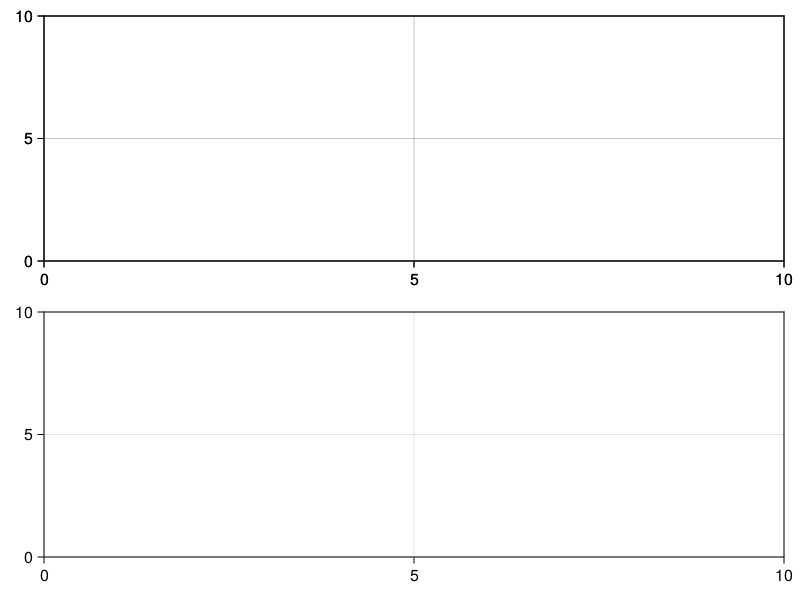

In [65]:
figts

In [61]:
changeshp = Shapefile.Table("data/hidalgo_change_2017_2018.shp")
changeds = maskcube(s1db, changeshp)

YAXArray Dataset
Dimensions: 
   Sample_9            Axis with 23 elements: 9_1 9_2 .. 9_22 9_23 
   Sample_3            Axis with 21 elements: 3_1 3_2 .. 3_20 3_21 
   Polarisation        Axis with 2 elements: VH VV 
   Sample_7            Axis with 8 elements: 7_1 7_2 7_3 7_4 7_5 7_6 7_7 7_8 
   Time                Axis with 105 Elements from 2015-11-18T00:00:00 to 2019-05-20T00:00:00
   Sample_2            Axis with 79 elements: 2_1 2_2 .. 2_78 2_79 
   Sample_8            Axis with 24 elements: 8_1 8_2 .. 8_23 8_24 
   Sample_5            Axis with 53 elements: 5_1 5_2 .. 5_52 5_53 
   Sample_4            Axis with 126 elements: 4_1 4_2 .. 4_125 4_126 
   Sample_1            Axis with 30 elements: 1_1 1_2 .. 1_29 1_30 
   Sample_10           Axis with 67 elements: 10_1 10_2 .. 10_66 10_67 
   Sample_6            Axis with 8 elements: 6_1 6_2 6_3 6_4 6_5 6_6 6_7 6_8 
Variables: ID_4 ID_5 ID_2 ID_3 ID_10 ID_1 ID_8 ID_9 ID_6 ID_7 

In [62]:
changecube = changeds.ID_2

YAXArray with the following dimensions
Sample_2            Axis with 79 elements: 2_1 2_2 .. 2_78 2_79 
Time                Axis with 105 Elements from 2015-11-18T00:00:00 to 2019-05-20T00:00:00
Polarisation        Axis with 2 elements: VH VV 
name: layer
Total size: 64.8 KB


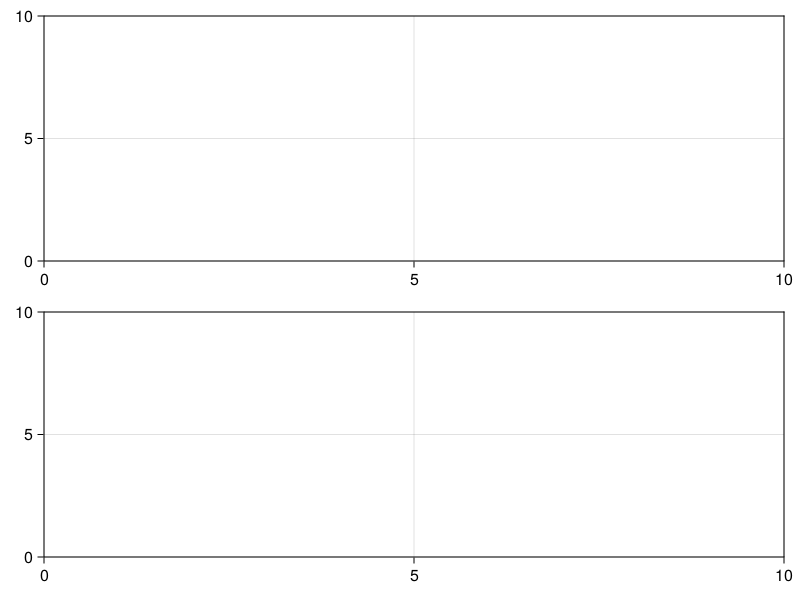

In [63]:
axch = Axis(figts[2,1])
lines!.(axch, eachrow(changecube[:,:,1]))
figts

## Percentile Range for change detection
- Computing of the percentile Range for the whole area of interest with YAXArrays
- Showing how it is done with this simple function


## What are Recurrence Plots

- Example time series
- playing around with the thresholds and the epsilon value
- Recurrence plots for the deforested area and the stable forest
- computing of the RQA trend for the whole area of interest via copy paste of the prange example as an exercise


In [ ]:
using Distributed
addprocs(4)

In [ ]:
@everywhere using Pkg

In [ ]:
@everywhere Pkg.activate(".")

In [ ]:
using Shapefile, Extents

In [ ]:
using Plots, PlotlyJS